# Interacting with CLIP

This is a self-contained notebook that shows how to download and run CLIP models, calculate the similarity between arbitrary image and text inputs, and perform zero-shot image classifications.

This is a forked version from [here](https://colab.sandbox.google.com/github/openai/clip/blob/master/notebooks/Interacting_with_CLIP.ipynb). **Please make a copy before trying it out yourself!**

# Preparation for Colab

Make sure you're running a GPU runtime; if not, select "GPU" as the hardware accelerator in Runtime > Change Runtime Type in the menu. The next cells will install the `clip` package and its dependencies, and check if PyTorch 1.7.1 or later is installed.

In [1]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 KB 2.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-rsjsxhl3
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-rsjsxhl3
  Resolved https://github.com/openai/CLIP.git to commit a9b1bf5920416aaeaec965c25dd9e8f98c864f16
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369398 sha256=cd8615c8bc092f0bbf48bf7117e58c81cf3e3390bd4eaa2381c674955f7d4586
  Stored in directory: /tmp/pip-ephem-wheel-cache-vcueopbz/wheels/c8/e4/e1/11374c111387672fc2068dfbe0d4b424cb9cdd1b2e184a71b5
Successfully built clip


In [4]:
import numpy as np
import torch
from pkg_resources import packaging

print("Torch version:", torch.__version__)


Torch version: 1.13.1+cu117


# Loading the model

`clip.available_models()` will list the names of available CLIP models.

In [1]:
import clip

# RN50 will be fastest, while ViT-L will be the most performant.
clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [5]:
model, preprocess = clip.load("RN50")
model.cuda().eval()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

Model parameters: 102,007,137
Input resolution: 224
Context length: 77
Vocab size: 49408


# Image Preprocessing

We resize the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, we will normalize the pixel intensity using the dataset mean and standard deviation.

The second return value from `clip.load()` contains a torchvision `Transform` that performs this preprocessing.



In [6]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=None)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7fd20f76c560>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

# Text Preprocessing

We use a case-insensitive tokenizer, which can be invoked using `clip.tokenize()`. By default, the outputs are padded to become 77 tokens long, which is what the CLIP models expects.

In [5]:
clip.tokenize("Hello World!")

tensor([[49406,  3306,  1002,   256, 49407,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0]], dtype=torch.int32)

# Setting up input images and texts

We are going to feed 8 example images and their textual descriptions to the model, and compare the similarity between the corresponding features.

The tokenizer is case-insensitive, and we can freely give any suitable textual descriptions.

In [10]:
import os
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# images in skimage to use and their textual descriptions
descriptions = {
    "page": "a page of text about segmentation",
    "chelsea": "a facial photo of a tabby cat",
    "astronaut": "a portrait of an astronaut with the American flag",
    "rocket": "a rocket standing on a launchpad",
    "motorcycle_right": "a red motorcycle standing in a garage",
    "camera": "a person looking at a camera on a tripod",
    "horse": "a black-and-white silhouette of a horse", 
    "coffee": "a cup of coffee on a saucer"
}

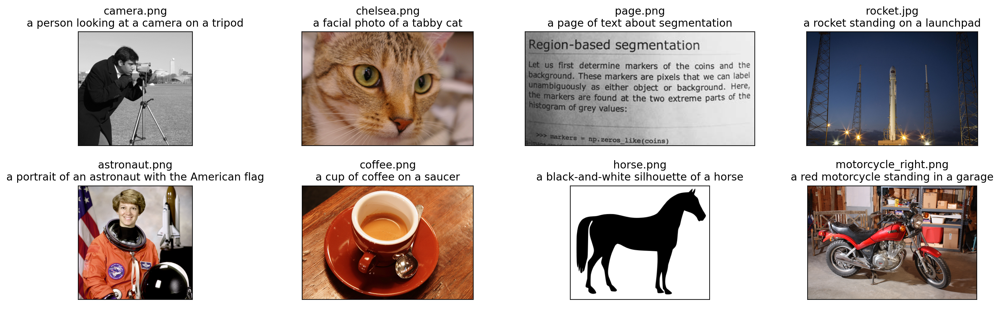

In [11]:
original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

for filename in [filename for filename in os.listdir(skimage.data_dir) if filename.endswith(".png") or filename.endswith(".jpg")]:
    name = os.path.splitext(filename)[0]
    if name not in descriptions:
        continue

    image = Image.open(os.path.join(skimage.data_dir, filename)).convert("RGB")
  
    plt.subplot(2, 4, len(images) + 1)
    plt.imshow(image)
    plt.title(f"{filename}\n{descriptions[name]}")
    plt.xticks([])
    plt.yticks([])

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(descriptions[name])

plt.tight_layout()


## Building features

We normalize the images, tokenize each text input, and run the forward pass of the model to get the image and text features.

In [12]:
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()

In [13]:
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

## Calculating cosine similarity

We normalize the features and calculate the dot product of each pair.

In [14]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

Text(0.5, 1.0, 'Cosine similarity between text and image features')

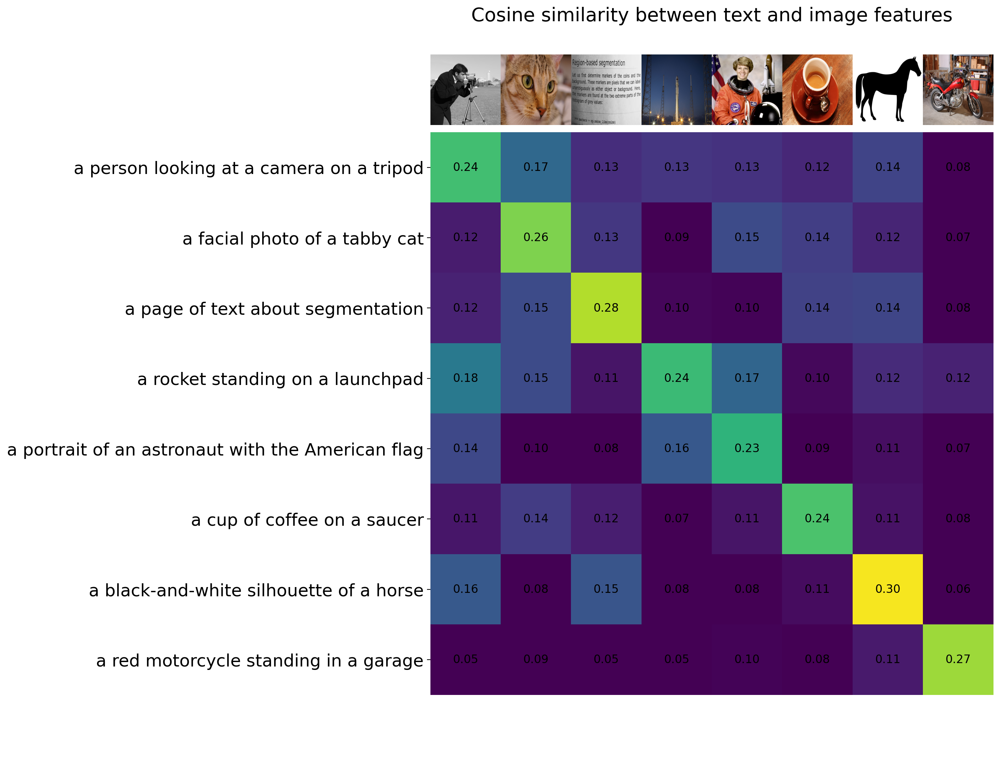

In [15]:
count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
    plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features", size=20)

# Zero-Shot Image Classification

You can classify images using the cosine similarity (times 100) as the logits to the softmax operation.

In [16]:
from torchvision.datasets import CIFAR100

cifar100 = CIFAR100(os.path.expanduser("~/.cache"), transform=preprocess, download=True)

Files already downloaded and verified


In [17]:
text_descriptions = [f"This is a photo of a {label}" for label in cifar100.classes]
text_tokens = clip.tokenize(text_descriptions).cuda()

In [18]:
with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

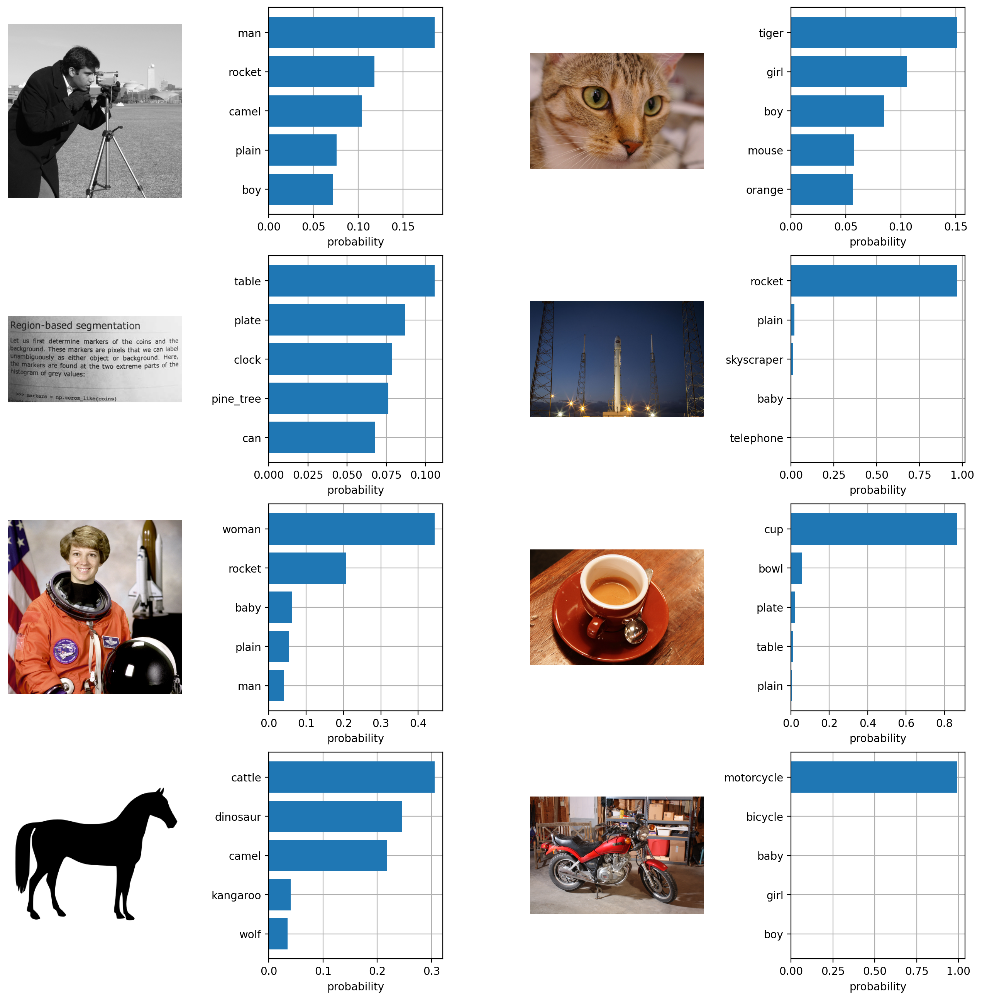

In [19]:
plt.figure(figsize=(16, 16))

for i, image in enumerate(original_images):
    plt.subplot(4, 4, 2 * i + 1)
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(4, 4, 2 * i + 2)
    y = np.arange(top_probs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    plt.yticks(y, [cifar100.classes[index] for index in top_labels[i].numpy()])
    plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5)
plt.show()

## Task 1: Zero-Shot Image Classification 

In [20]:
cifar100_test = CIFAR100(os.path.expanduser("~/.cache"), train=False, transform=preprocess, download=True)

Files already downloaded and verified


In [21]:
import random
random.seed(10)

n = len(cifar100_test.targets)

random_indices_500 = random.sample(list(range(n)), 500)
sample_500 = cifar100_test.data[random_indices_500]
sample_labels_500 = np.array(cifar100_test.targets)[random_indices_500]

In [22]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=None)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7fd20f76c560>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

In [23]:
images = np.stack([preprocess(Image.fromarray(image).convert('RGB')) for image in sample_500])
image_input_500 = torch.tensor(images).cuda()
text_descriptions = [f"This is a photo of a {label}" for label in cifar100_test.classes]
text_input_500 = clip.tokenize(text_descriptions).cuda()

In [24]:
with torch.no_grad():
    text_features_500 = model.encode_text(text_input_500).float()
    text_features_500 /= text_features_500.norm(dim=-1, keepdim=True)

    image_features_500 = model.encode_image(image_input_500).float()
    image_features_500 /= image_features_500.norm(dim=-1, keepdim=True)

text_probs = (100.0 * image_features_500 @ text_features_500.T).softmax(dim=-1)
pred_labels = text_probs.cpu().argmax(dim=-1)
top5_labels = text_probs.cpu().topk(5, dim=-1)

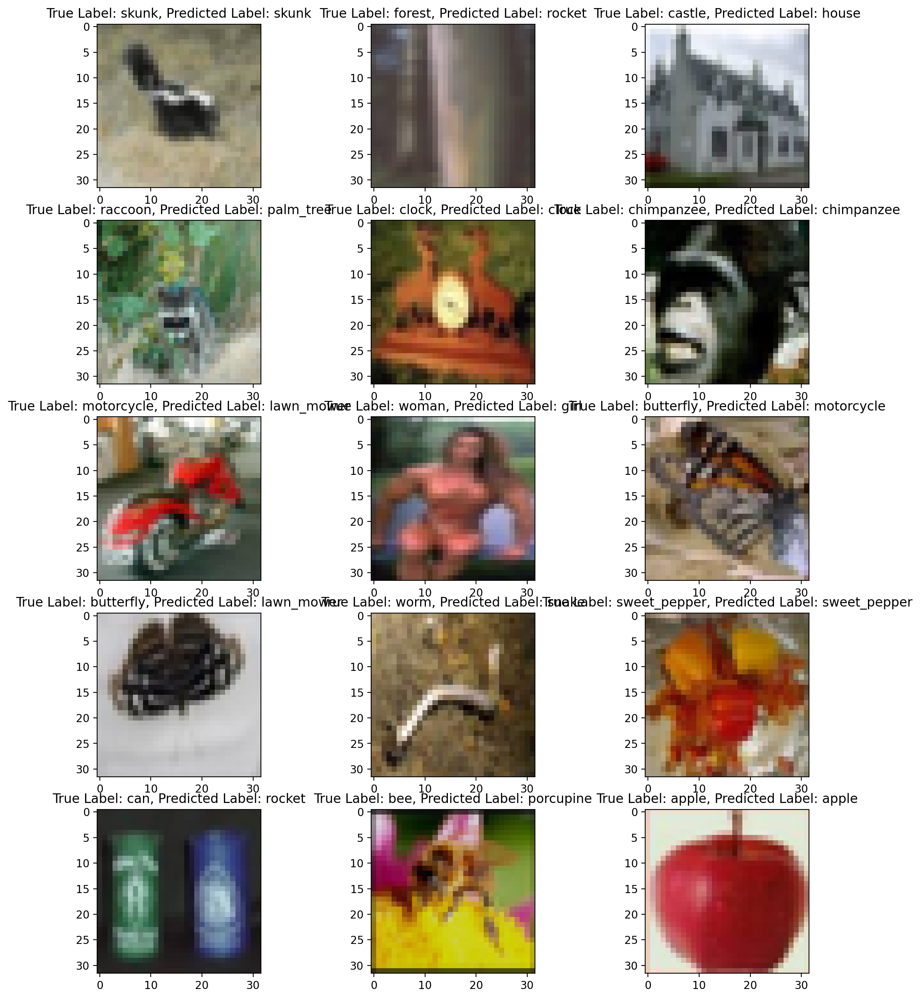

In [25]:
pred_labels_text = [cifar100_test.classes[label] for label in pred_labels]
true_labels_text = [cifar100_test.classes[label] for label in sample_labels_500]

plt.figure(figsize=(13, 16))

for i in range(15):
    plt.subplot(5, 3, i+1)
    plt.imshow(Image.fromarray(sample_500[i]).convert('RGB'))
    plt.title(f'True Label: {true_labels_text[i]}, Predicted Label: {pred_labels_text[i]}')


In [26]:
accuracy = np.mean(pred_labels.numpy() == sample_labels_500)
top5_accuracy = np.mean([label in top5_predic for label, top5_predic in zip(sample_labels_500, top5_labels.indices.numpy())])

print("Accuracy", accuracy)
print("Top 5 Accuracy", top5_accuracy)

Accuracy 0.406
Top 5 Accuracy 0.728


## Task 2: Linear Probing with CLIP

In [27]:
n = len(cifar100.targets)

random_indices_1000 = random.sample(list(range(n)), 1000)
sample_1000 = cifar100.data[random_indices_1000]
sample_labels_1000 = np.array(cifar100.targets)[random_indices_1000]

In [28]:
images_lp = np.stack([preprocess(Image.fromarray(image).convert('RGB')) for image in sample_1000])
image_input_1000 = torch.tensor(images_lp).cuda()

In [29]:
class LinearClassifier(torch.nn.Module):
    def __init__(self, output_dim, clip_model):
        super(LinearClassifier, self).__init__()
        self.clip = clip_model
        for param in self.clip.parameters():
            param.requires_grad = False
        self.linear = torch.nn.Linear(1024, output_dim)

    def forward(self, x):
        x = self.clip.encode_image(x).float()
        x = self.linear(x)
        return x

In [30]:
from tqdm import tqdm 

clf = LinearClassifier(len(cifar100.classes), model).cuda()
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(clf.parameters(), lr=0.005, weight_decay=1e-5)

all_loss_train = []
batch_size = 128

y_train = torch.tensor(sample_labels_1000).cuda()

for epoch in tqdm(range(50)):
    for batch_num in range(int(len(image_input_1000)/batch_size)+1):
        batch = image_input_1000[batch_num*batch_size:(batch_num+1)*batch_size]
        batch_labels = y_train[batch_num*batch_size:(batch_num+1)*batch_size]

        output = clf(batch)

        loss = criterion(output, batch_labels.view(-1))
        all_loss_train.append(loss.item())
        loss.backward()

        optimizer.step()
        optimizer.zero_grad()
    if (epoch+1)%1 == 0:
        train_accuracy = np.mean(sample_labels_1000 == clf(image_input_1000).argmax(axis=-1).cpu().numpy())
        test_accuracy = np.mean(sample_labels_500 == clf(image_input_500).argmax(axis=-1).cpu().numpy())
        print(f'Epoch {epoch + 1}: Loss = {loss}, Train Acc={train_accuracy}, Test Acc={test_accuracy}')

  2%|██▌                                                                                                                           | 1/50 [00:01<00:52,  1.06s/it]

Epoch 1: Loss = 4.507030487060547, Train Acc=0.097, Test Acc=0.048


  4%|█████                                                                                                                         | 2/50 [00:02<00:50,  1.06s/it]

Epoch 2: Loss = 4.2329840660095215, Train Acc=0.202, Test Acc=0.098


  6%|███████▌                                                                                                                      | 3/50 [00:03<00:49,  1.06s/it]

Epoch 3: Loss = 3.983257532119751, Train Acc=0.314, Test Acc=0.178


  8%|██████████                                                                                                                    | 4/50 [00:04<00:48,  1.05s/it]

Epoch 4: Loss = 3.7618417739868164, Train Acc=0.433, Test Acc=0.238


 10%|████████████▌                                                                                                                 | 5/50 [00:05<00:47,  1.05s/it]

Epoch 5: Loss = 3.562633514404297, Train Acc=0.481, Test Acc=0.28


 12%|███████████████                                                                                                               | 6/50 [00:06<00:46,  1.05s/it]

Epoch 6: Loss = 3.37624192237854, Train Acc=0.513, Test Acc=0.306


 14%|█████████████████▋                                                                                                            | 7/50 [00:07<00:45,  1.05s/it]

Epoch 7: Loss = 3.1976022720336914, Train Acc=0.546, Test Acc=0.324


 16%|████████████████████▏                                                                                                         | 8/50 [00:08<00:44,  1.05s/it]

Epoch 8: Loss = 3.0270166397094727, Train Acc=0.582, Test Acc=0.338


 18%|██████████████████████▋                                                                                                       | 9/50 [00:09<00:43,  1.05s/it]

Epoch 9: Loss = 2.8664958477020264, Train Acc=0.609, Test Acc=0.352


 20%|█████████████████████████                                                                                                    | 10/50 [00:10<00:42,  1.05s/it]

Epoch 10: Loss = 2.7171642780303955, Train Acc=0.638, Test Acc=0.37


 22%|███████████████████████████▌                                                                                                 | 11/50 [00:11<00:41,  1.06s/it]

Epoch 11: Loss = 2.5788724422454834, Train Acc=0.659, Test Acc=0.39


 24%|██████████████████████████████                                                                                               | 12/50 [00:12<00:40,  1.06s/it]

Epoch 12: Loss = 2.450810194015503, Train Acc=0.674, Test Acc=0.402


 26%|████████████████████████████████▌                                                                                            | 13/50 [00:13<00:39,  1.06s/it]

Epoch 13: Loss = 2.3320841789245605, Train Acc=0.692, Test Acc=0.406


 28%|███████████████████████████████████                                                                                          | 14/50 [00:14<00:38,  1.06s/it]

Epoch 14: Loss = 2.2219126224517822, Train Acc=0.705, Test Acc=0.41


 30%|█████████████████████████████████████▌                                                                                       | 15/50 [00:15<00:37,  1.06s/it]

Epoch 15: Loss = 2.1196024417877197, Train Acc=0.719, Test Acc=0.416


 32%|████████████████████████████████████████                                                                                     | 16/50 [00:16<00:35,  1.06s/it]

Epoch 16: Loss = 2.024505376815796, Train Acc=0.74, Test Acc=0.406


 34%|██████████████████████████████████████████▌                                                                                  | 17/50 [00:17<00:34,  1.06s/it]

Epoch 17: Loss = 1.9360129833221436, Train Acc=0.752, Test Acc=0.41


 36%|█████████████████████████████████████████████                                                                                | 18/50 [00:19<00:33,  1.06s/it]

Epoch 18: Loss = 1.8535600900650024, Train Acc=0.767, Test Acc=0.416


 38%|███████████████████████████████████████████████▌                                                                             | 19/50 [00:20<00:32,  1.06s/it]

Epoch 19: Loss = 1.7766286134719849, Train Acc=0.788, Test Acc=0.42


 40%|██████████████████████████████████████████████████                                                                           | 20/50 [00:21<00:31,  1.06s/it]

Epoch 20: Loss = 1.7047429084777832, Train Acc=0.799, Test Acc=0.43


 42%|████████████████████████████████████████████████████▌                                                                        | 21/50 [00:22<00:30,  1.06s/it]

Epoch 21: Loss = 1.6374670267105103, Train Acc=0.806, Test Acc=0.43


 44%|███████████████████████████████████████████████████████                                                                      | 22/50 [00:23<00:29,  1.06s/it]

Epoch 22: Loss = 1.5744037628173828, Train Acc=0.817, Test Acc=0.428


 46%|█████████████████████████████████████████████████████████▌                                                                   | 23/50 [00:24<00:28,  1.06s/it]

Epoch 23: Loss = 1.5151927471160889, Train Acc=0.825, Test Acc=0.432


 48%|████████████████████████████████████████████████████████████                                                                 | 24/50 [00:25<00:27,  1.06s/it]

Epoch 24: Loss = 1.4595110416412354, Train Acc=0.833, Test Acc=0.434


 50%|██████████████████████████████████████████████████████████████▌                                                              | 25/50 [00:26<00:26,  1.06s/it]

Epoch 25: Loss = 1.407065510749817, Train Acc=0.84, Test Acc=0.432


 52%|█████████████████████████████████████████████████████████████████                                                            | 26/50 [00:27<00:25,  1.06s/it]

Epoch 26: Loss = 1.3575941324234009, Train Acc=0.846, Test Acc=0.434


 54%|███████████████████████████████████████████████████████████████████▌                                                         | 27/50 [00:28<00:24,  1.06s/it]

Epoch 27: Loss = 1.3108588457107544, Train Acc=0.855, Test Acc=0.438


 56%|██████████████████████████████████████████████████████████████████████                                                       | 28/50 [00:29<00:23,  1.06s/it]

Epoch 28: Loss = 1.2666453123092651, Train Acc=0.861, Test Acc=0.444


 58%|████████████████████████████████████████████████████████████████████████▌                                                    | 29/50 [00:30<00:22,  1.06s/it]

Epoch 29: Loss = 1.2247599363327026, Train Acc=0.87, Test Acc=0.446


 60%|███████████████████████████████████████████████████████████████████████████                                                  | 30/50 [00:31<00:21,  1.06s/it]

Epoch 30: Loss = 1.1850287914276123, Train Acc=0.872, Test Acc=0.448


 62%|█████████████████████████████████████████████████████████████████████████████▌                                               | 31/50 [00:32<00:20,  1.06s/it]

Epoch 31: Loss = 1.1472933292388916, Train Acc=0.877, Test Acc=0.45


 64%|████████████████████████████████████████████████████████████████████████████████                                             | 32/50 [00:33<00:19,  1.06s/it]

Epoch 32: Loss = 1.1114109754562378, Train Acc=0.888, Test Acc=0.448


 66%|██████████████████████████████████████████████████████████████████████████████████▌                                          | 33/50 [00:34<00:18,  1.06s/it]

Epoch 33: Loss = 1.0772533416748047, Train Acc=0.89, Test Acc=0.448


 68%|█████████████████████████████████████████████████████████████████████████████████████                                        | 34/50 [00:36<00:17,  1.06s/it]

Epoch 34: Loss = 1.0447022914886475, Train Acc=0.896, Test Acc=0.446


 70%|███████████████████████████████████████████████████████████████████████████████████████▌                                     | 35/50 [00:37<00:15,  1.06s/it]

Epoch 35: Loss = 1.0136512517929077, Train Acc=0.9, Test Acc=0.446


 72%|██████████████████████████████████████████████████████████████████████████████████████████                                   | 36/50 [00:38<00:14,  1.07s/it]

Epoch 36: Loss = 0.9840030074119568, Train Acc=0.907, Test Acc=0.446


 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37/50 [00:39<00:13,  1.07s/it]

Epoch 37: Loss = 0.9556687474250793, Train Acc=0.908, Test Acc=0.444


 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38/50 [00:40<00:12,  1.07s/it]

Epoch 38: Loss = 0.9285674691200256, Train Acc=0.914, Test Acc=0.44


 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39/50 [00:41<00:11,  1.07s/it]

Epoch 39: Loss = 0.9026244878768921, Train Acc=0.918, Test Acc=0.446


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40/50 [00:42<00:10,  1.07s/it]

Epoch 40: Loss = 0.8777716159820557, Train Acc=0.922, Test Acc=0.446


 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41/50 [00:43<00:09,  1.07s/it]

Epoch 41: Loss = 0.8539458513259888, Train Acc=0.927, Test Acc=0.45


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42/50 [00:44<00:08,  1.07s/it]

Epoch 42: Loss = 0.8310897350311279, Train Acc=0.93, Test Acc=0.452


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43/50 [00:45<00:07,  1.07s/it]

Epoch 43: Loss = 0.8091496229171753, Train Acc=0.936, Test Acc=0.454


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44/50 [00:46<00:06,  1.07s/it]

Epoch 44: Loss = 0.7880759835243225, Train Acc=0.937, Test Acc=0.454


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45/50 [00:47<00:05,  1.07s/it]

Epoch 45: Loss = 0.767823338508606, Train Acc=0.938, Test Acc=0.456


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46/50 [00:48<00:04,  1.07s/it]

Epoch 46: Loss = 0.7483489513397217, Train Acc=0.942, Test Acc=0.452


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47/50 [00:49<00:03,  1.07s/it]

Epoch 47: Loss = 0.7296141386032104, Train Acc=0.945, Test Acc=0.454


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48/50 [00:50<00:02,  1.07s/it]

Epoch 48: Loss = 0.7115815877914429, Train Acc=0.947, Test Acc=0.456


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49/50 [00:52<00:01,  1.07s/it]

Epoch 49: Loss = 0.6942173838615417, Train Acc=0.947, Test Acc=0.458


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:53<00:00,  1.06s/it]

Epoch 50: Loss = 0.6774895787239075, Train Acc=0.948, Test Acc=0.458


In [29]:
torch.save(clf.state_dict(), f'./classifiers/cifar100__classification_head.pt')


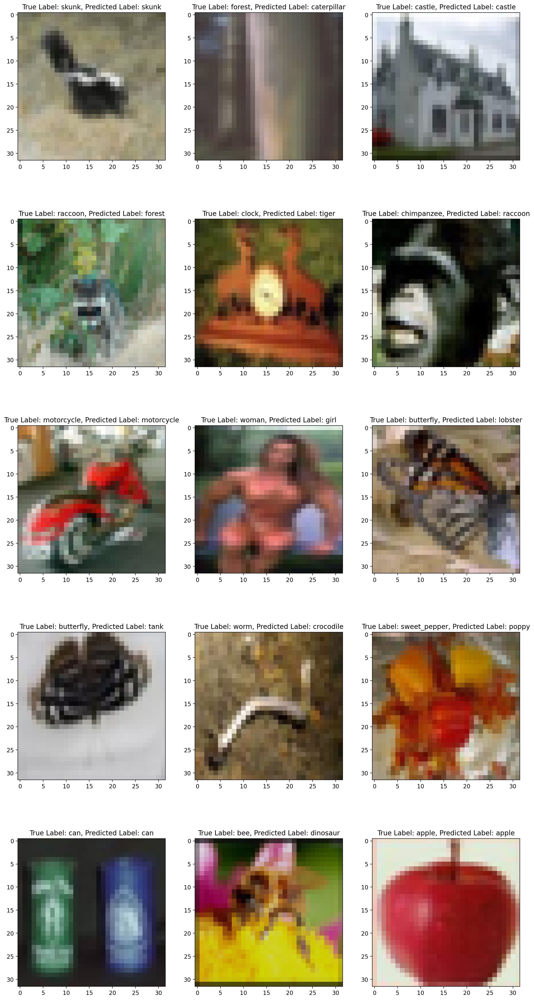

In [48]:
text_probs = (clf(image_input_500)).softmax(dim=-1)
pred_labels = text_probs.cpu().argmax(dim=-1)

pred_labels_text = [cifar100.classes[label] for label in pred_labels]
true_labels_text = [cifar100.classes[label] for label in sample_labels_500]

plt.figure(figsize=(16, 32))

for i in range(15):
    plt.subplot(5, 3, i+1)
    plt.imshow(Image.fromarray(sample_500[i]).convert('RGB'))
    plt.title(f'True Label: {true_labels_text[i]}, Predicted Label: {pred_labels_text[i]}')


In [49]:
text_probs = (clf(image_input_500)).softmax(dim=-1)
pred_labels = text_probs.cpu().argmax(dim=-1)
top5_labels = text_probs.cpu().topk(5, dim=-1)

accuracy = np.mean(pred_labels.numpy() == sample_labels_500)
top5_accuracy = np.mean([label in top5_predic for label, top5_predic in zip(sample_labels_500, top5_labels.indices.numpy())])

print("Accuracy", accuracy)
print("Top 5 Accuracy", top5_accuracy)

Accuracy 0.458
Top 5 Accuracy 0.772


## Task 3: Converting Images into a list of Objects

In [73]:
import pandas as pd

train_images = pd.read_table('Flickr_8k.trainImages.txt', names=['image_name'])
image_captions = pd.read_table('Flickr8k.token.txt', names=['image_name', 'caption'])

image_captions['number'] = image_captions.apply(lambda row: row['image_name'].split('#')[1], axis=1)
image_captions['image_name'] = image_captions.apply(lambda row: row['image_name'].split('#')[0], axis=1)

image_captions.head()

,image_name,caption,number
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...,0
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .,1
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .,2
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...,3
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...,4


In [74]:
import nltk
nltk.download('stopwords')
nltk.download('words')

[nltk_data] Downloading package stopwords to
[nltk_data]     /users/sanand14/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to /users/sanand14/nltk_data...
[nltk_data]   Package words is already up-to-date!


True

In [75]:
from functools import reduce
from nltk.corpus import stopwords

sws = stopwords.words('english')

all_captions = reduce(lambda a,b:a+b, image_captions['caption'].tolist())
all_captions = [word.lower() for word in all_captions.split() if word.isalpha()]
all_captions = [word for word in all_captions if word not in sws]

In [76]:
from collections import Counter

count_words = Counter(all_captions)
print(f'There are {len(count_words)} unique words')
print(count_words.most_common(10))

There are 10031 unique words
[('dog', 7940), ('man', 6803), ('white', 3874), ('black', 3692), ('boy', 3432), ('woman', 3217), ('girl', 3205), ('wearing', 3061), ('red', 2666), ('water', 2646)]


In [77]:
object_classes = ['dog', 'boy', 'man', 'girl', 'woman', 'child', 'none']

def get_label_from_caption(caption):
    for idx, obj in enumerate(object_classes[:-1]):
        if obj in caption:
            return idx
    return len(object_classes) - 1

image_captions['label'] = image_captions['caption'].apply(get_label_from_caption)

In [78]:
image_captions_train = image_captions[image_captions['image_name'].isin(train_images['image_name'].tolist())]
image_captions_test = image_captions[~image_captions['image_name'].isin(train_images['image_name'].tolist())]
image_captions_test['image_name'] = image_captions_test['image_name'].apply(lambda s: s.split('.jpg')[0] + '.jpg')

## only get images in train set

/gpfs/home/sanand14/interventions/interventions-venv/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [79]:
training_set = image_captions_train.sample(5000)
training_images = np.stack([preprocess(Image.open('Flicker8k_Dataset/' + image).convert("RGB")) for image in training_set['image_name'].tolist()])
training_labels = np.array(training_set['label'])

test_set = image_captions_train.sample(500) # will likely be leakage but not a big deal, this is just used as a heuristic
test_images = np.stack([preprocess(Image.open('Flicker8k_Dataset/' + image).convert("RGB")) for image in test_set['image_name'].tolist()])
test_labels = np.array(test_set['label'])

training_images = torch.tensor(training_images).cuda()
test_images = torch.tensor(test_images).cuda()
training_labels = torch.tensor(training_labels).cuda()
test_labels = torch.tensor(test_labels).cuda()

In [80]:
import spacy

sp = spacy.load('en_core_web_sm')

words_to_use = count_words.most_common(1500)
#words_to_use = [word[0] for word in words_to_use if (sp(word[0])[0].pos_ in ['NOUN', 'VERB', 'PROPN', 'ADJ'])]

nouns_to_use = [word[0] for word in words_to_use if (sp(word[0])[0].pos_ in ['NOUN', 'PROPN'])]
verbs_to_use = [word[0] for word in words_to_use if (sp(word[0])[0].pos_ in ['VERB'])]
adjs_to_use = [word[0] for word in words_to_use if (sp(word[0])[0].pos_ in ['ADJ'])]

### include nouns, verbs, proper nouns, and adjectives
### use the most commonly occuring words in the training set of flickr

In [81]:
def create_sentence(word):
    sp_word = sp(word)
    pos = sp_word[0].pos_
    if pos == 'NOUN' or pos == 'PROPN':
        return f'This photo has a {word}'
    elif pos == 'VERB':
        return f'The action in this photo is {word}'
    else:
        raise(ValueError("Please input a word that is a noun or verb"))

noun_sentences_to_use = [create_sentence(word) for word in nouns_to_use]
verb_sentences_to_use = [create_sentence(word) for word in verbs_to_use]

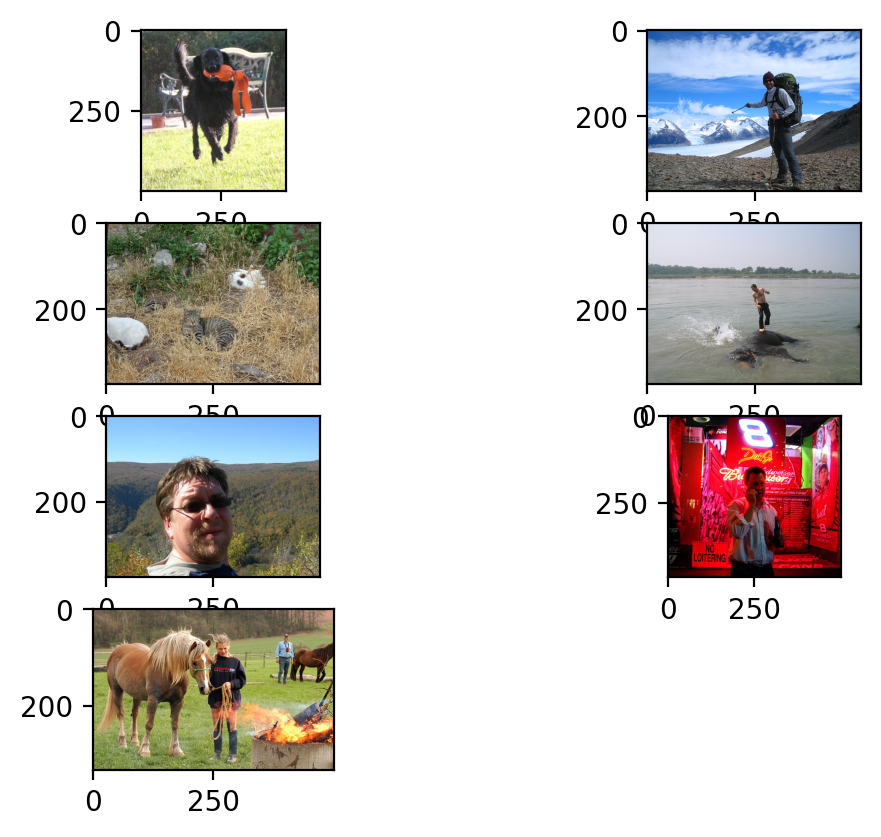

In [82]:
import glob

images = glob.glob('photos/*.jpg')
for idx, image in enumerate(images):
    plt.subplot(int(len(images)/2)+1, 2, idx+1)
    image = Image.open(image).convert("RGB")
    plt.imshow(image)

In [83]:
images_flckr = np.stack([preprocess(Image.open(image).convert("RGB")) for image in images])
images_flckr = torch.tensor(images_flckr).cuda()
images_flckr_embeddings = model.encode_image(images_flckr).float()
images_flckr_embeddings /= images_flckr_embeddings.norm(dim=-1, keepdim=True)


text_cands_flckr_nouns = clip.tokenize(noun_sentences_to_use).cuda()
text_cands_flckr_embeddings_nouns = model.encode_text(text_cands_flckr_nouns).float()
text_cands_flckr_embeddings_nouns /= text_cands_flckr_embeddings_nouns.norm(dim=-1, keepdim=True)

text_cands_flckr_verbs = clip.tokenize(verb_sentences_to_use).cuda()
text_cands_flckr_embeddings_verbs = model.encode_text(text_cands_flckr_verbs).float()
text_cands_flckr_embeddings_verbs /= text_cands_flckr_embeddings_verbs.norm(dim=-1, keepdim=True)

text_probs_nouns = (100.0 * images_flckr_embeddings @ text_cands_flckr_embeddings_nouns.T).softmax(dim=-1)
top_probs_nouns, top_labels_nouns = text_probs_nouns.cpu().topk(6, dim=-1)

text_probs_verbs = (100.0 * images_flckr_embeddings @ text_cands_flckr_embeddings_verbs.T).softmax(dim=-1)
top_probs_verbs, top_labels_verbs = text_probs_verbs.cpu().topk(6, dim=-1)


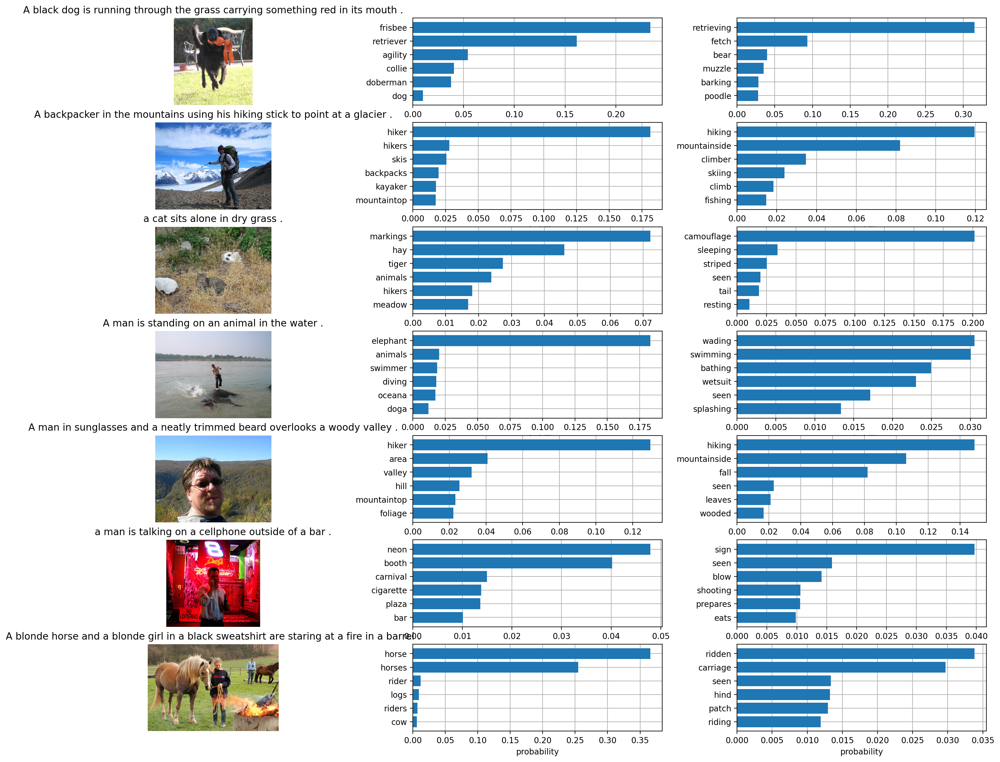

In [84]:
plt.figure(figsize=(20, 16))

for i, image in enumerate(images):
    
    plt.subplot(7, 3, 3 * i + 1)
    plt.imshow(Image.open(image).convert("RGB"))
    plt.title(image_captions.loc[image_captions['image_name'].apply(lambda x: x in image), 'caption'].iloc[0])
    plt.axis("off")

    plt.subplot(7, 3, 3 * i + 2)
    y = np.arange(top_probs_nouns.shape[-1])
    plt.grid()
    plt.barh(y, top_probs_nouns[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    plt.yticks(y, [nouns_to_use[index] for index in top_labels_nouns[i].numpy()])
    plt.xlabel("probability")
    
    plt.subplot(7, 3, 3 * i + 3)
    y = np.arange(top_probs_verbs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs_verbs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    plt.yticks(y, [verbs_to_use[index] for index in top_labels_verbs[i].numpy()])
    plt.xlabel("probability")

plt.subplots_adjust(wspace=0.3)
plt.show()

In [85]:
from tqdm import tqdm 

clf = LinearClassifier(len(object_classes), model).cuda()
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(clf.parameters(), lr=0.005, weight_decay=1e-8)

all_loss_train = []
batch_size = 32

for epoch in tqdm(range(10)):
    for batch_num in range(int(len(training_images)/batch_size)+1):
        batch = training_images[batch_num*batch_size:(batch_num+1)*batch_size]
        batch_labels = training_labels[batch_num*batch_size:(batch_num+1)*batch_size]

        output = clf(batch)

        loss = criterion(output, batch_labels.view(-1))
        all_loss_train.append(loss.item())
        loss.backward()

        optimizer.step()
        optimizer.zero_grad()
        
    if (epoch+1)%1 == 0:
        #train_accuracy = np.mean(training_labels == clf(training_images).argmax(axis=-1).cpu().numpy())
        test_accuracy = np.mean(test_labels.cpu().numpy() == clf(test_images).argmax(axis=-1).cpu().numpy())
        print(f'Epoch {epoch + 1}: Loss = {all_loss_train[-1]}, Test Acc={test_accuracy}')

 10%|████████████▌                                                                                                                 | 1/10 [00:02<00:23,  2.63s/it]

Epoch 1: Loss = 0.7653216123580933, Test Acc=0.708


 20%|█████████████████████████▏                                                                                                    | 2/10 [00:05<00:20,  2.62s/it]

Epoch 2: Loss = 0.623623788356781, Test Acc=0.706


 30%|█████████████████████████████████████▊                                                                                        | 3/10 [00:07<00:18,  2.62s/it]

Epoch 3: Loss = 0.5508239269256592, Test Acc=0.712


 40%|██████████████████████████████████████████████████▍                                                                           | 4/10 [00:10<00:15,  2.62s/it]

Epoch 4: Loss = 0.5026853680610657, Test Acc=0.714


 50%|███████████████████████████████████████████████████████████████                                                               | 5/10 [00:13<00:13,  2.63s/it]

Epoch 5: Loss = 0.4686487913131714, Test Acc=0.722


 60%|███████████████████████████████████████████████████████████████████████████▌                                                  | 6/10 [00:15<00:10,  2.63s/it]

Epoch 6: Loss = 0.4434141516685486, Test Acc=0.724


 70%|████████████████████████████████████████████████████████████████████████████████████████▏                                     | 7/10 [00:18<00:07,  2.63s/it]

Epoch 7: Loss = 0.4238382577896118, Test Acc=0.724


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 8/10 [00:21<00:05,  2.64s/it]

Epoch 8: Loss = 0.4080476462841034, Test Acc=0.724


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 9/10 [00:23<00:02,  2.64s/it]

Epoch 9: Loss = 0.39491236209869385, Test Acc=0.73


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:26<00:00,  2.64s/it]

Epoch 10: Loss = 0.38372787833213806, Test Acc=0.732


In [86]:
images_flckr_objs = clf(images_flckr).argmax(dim=-1).cpu().numpy()
images_flckr_objs = [object_classes[idx] for idx in images_flckr_objs]
## objects detected

In [47]:
torch.save(clf.state_dict(), './classifiers/flicker_object_classifier.pt')

In [87]:
from nltk.stem import PorterStemmer
from nltk.corpus import words

ps = PorterStemmer()

def remove_redundancy(candidate_words, number_cand_nouns = 2, number_cand_verbs = 1):
    candidate_words_fixed = []

    for i in range(len(top_labels_nouns)):
        candidate_word_label = []
        stem_candidate_word_label = []
        for word in candidate_words[i]:
            if ps.stem(word) not in stem_candidate_word_label and word != "none":
                stem_candidate_word_label.append(ps.stem(word))
                candidate_word_label.append(word)
        candidate_words_fixed.append(candidate_word_label)
    return candidate_words_fixed

number_cand_nouns = 2
number_cand_verbs = 1

candidate_words = [[images_flckr_objs[i]] + [nouns_to_use[index] for index in top_labels_nouns[i].numpy()[:number_cand_nouns]] + 
                   [verbs_to_use[index] for index in top_labels_verbs[i].numpy()[:number_cand_verbs]] for i in range(len(top_labels_nouns))]
candidate_words_fixed = remove_redundancy(candidate_words, number_cand_nouns = 2, number_cand_verbs = 1)

In [91]:
candidate_words_fixed

[['dog', 'frisbee', 'retriever'],
 ['man', 'hiker', 'hiking'],
 ['markings', 'hay', 'camouflage'],
 ['dog', 'elephant', 'animals', 'wading'],
 ['man', 'hiker', 'area', 'hiking'],
 ['man', 'neon', 'booth', 'sign'],
 ['girl', 'horse', 'ridden']]

## Task 4: Stitch Caption with GPT

In [89]:
import openai

# Create your own OpenAI API key
# https://help.openai.com/en/articles/4936850-where-do-i-find-my-secret-api-key
api_key = open('openai_key', 'r').read().strip()
openai.api_key = api_key

In [90]:
cd gpt3-sandbox/

/gpfs/home/sanand14/mps/mp1/gpt3-sandbox


In [92]:
from api import GPT, Example, set_openai_key

gpt = GPT(engine='davinci',
          temperature=0.5,
          max_tokens=100)

set_openai_key(api_key)

# zero-shot image captioning based on three detected objects
prompt = 'dog, frisbee, retriever'
# Inspect the output yourself, does it look reasonable to you?
# print(gpt.get_top_reply(prompt))

# Add some in-context examples..

gpt.add_example(Example('man, cellphone', 'A man is talking on a cellphone outside.'))
gpt.add_example(Example('black, dog, running', 'A black dog is running down a field.'))
gpt.add_example(Example('men, pond, fishing', 'The men are fishing in a murky pond'))

# Inspect the output yourself, does it now look reasonable to you?
# Run the code block multiple times, are the results the same?
print(gpt.get_top_reply(prompt))

output: A dog is catching a frisbee in his mouth.




In [93]:
prompts = ['Make a sentence from Flicker8k the following words:' + ', '.join(words) for words in candidate_words_fixed]
preds, answers = [], []
for i, (image, prompt) in enumerate(zip(images, prompts)):
    pred = gpt.get_top_reply(prompt).replace('output:', '').replace('\n', '')
    ans = image_captions.loc[image_captions['image_name'].apply(lambda x: x in image), 'caption'].iloc[0]
    preds.append(pred)
    answers.append(ans)
    print("Predicted Answer: ", pred)
    print("True Answer: ", ans)
    print()

Predicted Answer:   The dog is playing with a frisbee. A retriever is playing with a frisbee.
True Answer:  A black dog is running through the grass carrying something red in its mouth .

Predicted Answer:   A man is hiking in the mountains.
True Answer:  A backpacker in the mountains using his hiking stick to point at a glacier .

Predicted Answer:   A man is walking his dog in a field. The dog is wearing camouflage. The men are fishing in a murky pond.
True Answer:  a cat sits alone in dry grass .

Predicted Answer:   A dog is wading in a pool of animals
True Answer:  A man is standing on an animal in the water .

Predicted Answer:   A man hiking in an area
True Answer:  A man in sunglasses and a neatly trimmed beard overlooks a woody valley .

Predicted Answer:  
True Answer:  a man is talking on a cellphone outside of a bar .

Predicted Answer:   A girl is riding a horse.
True Answer:  A blonde horse and a blonde girl in a black sweatshirt are staring at a fire in a barrel .



In [100]:
from torchmetrics.functional import bleu_score

bleu_score(preds, answers, n_gram=1)

tensor(0.1733)

In [101]:
bleu_score(preds, answers, n_gram=2)

tensor(0.0743)

## Task 5: Run on 100 Flickr 8k Validation Images

In [104]:
cd ..

/gpfs/home/sanand14/mps/mp1


In [105]:
test_set = image_captions_test.sample(100)
test_images = np.stack([preprocess(Image.open('Flicker8k_Dataset/' + image).convert("RGB")) for image in test_set['image_name'].tolist()])
test_captions = np.array(test_set['caption'])

test_images = torch.tensor(test_images).cuda()

test_images_embeddings = model.encode_image(test_images).float()
test_images_embeddings /= test_images_embeddings.norm(dim=-1, keepdim=True)


text_cands_flckr_nouns = clip.tokenize(noun_sentences_to_use).cuda()
text_cands_flckr_embeddings_nouns = model.encode_text(text_cands_flckr_nouns).float()
text_cands_flckr_embeddings_nouns /= text_cands_flckr_embeddings_nouns.norm(dim=-1, keepdim=True)

text_cands_flckr_verbs = clip.tokenize(verb_sentences_to_use).cuda()
text_cands_flckr_embeddings_verbs = model.encode_text(text_cands_flckr_verbs).float()
text_cands_flckr_embeddings_verbs /= text_cands_flckr_embeddings_verbs.norm(dim=-1, keepdim=True)

text_probs_nouns = (100.0 * test_images_embeddings @ text_cands_flckr_embeddings_nouns.T).softmax(dim=-1)
test_top_probs_nouns, test_top_labels_nouns = text_probs_nouns.cpu().topk(6, dim=-1)

text_probs_verbs = (100.0 * test_images_embeddings @ text_cands_flckr_embeddings_verbs.T).softmax(dim=-1)
test_top_probs_verbs, test_top_labels_verbs = text_probs_verbs.cpu().topk(6, dim=-1)

test_objs = clf(test_images).argmax(dim=-1).cpu().numpy()
test_objs = [object_classes[idx] for idx in test_objs]

test_candidate_words = [[test_objs[i]] + [nouns_to_use[index] for index in test_top_labels_nouns[i].numpy()[:number_cand_nouns]] + 
                   [verbs_to_use[index] for index in test_top_labels_verbs[i].numpy()[:number_cand_verbs]] for i in range(len(test_top_labels_nouns))]
test_candidate_words_fixed = []

for i in range(len(test_top_labels_nouns)):
    candidate_word_label = []
    stem_candidate_word_label = []
    for word in test_candidate_words[i]:
        if ps.stem(word) not in stem_candidate_word_label and 'none' not in word:
            stem_candidate_word_label.append(ps.stem(word))
            candidate_word_label.append(word)
    test_candidate_words_fixed.append(candidate_word_label)
    

prompts = ['Make a sentence from Flicker8k the following words: ' + ', '.join(words) for words in test_candidate_words_fixed]
data_tuples = []

for i, prompt in enumerate(prompts):
    pred = gpt.get_top_reply(prompt).replace('output:', '').replace('\n', '')
    act = test_captions[i]
    print("Predicted Answer: ", pred)
    print("True Answer: ", act)
    print()
    data_tuples.append((test_set.iloc[i]['image_name'], pred, act))
    

Predicted Answer:   The boy is crawling in the foreground of a group of children.
True Answer:  Three boys play in an unfinished building .

Predicted Answer:   Dog leashes are for sale at the barking festival.
True Answer:  A man is encouraging a small white dog to stand on its hind legs in a dog show .

Predicted Answer:   A school for African children sells colorful scarves.
True Answer:  A black man in a blue shirt stands next to a black man in a red robe .

Predicted Answer:   The dog has a muzzle on.
True Answer:  Two dogs in snow .

Predicted Answer:  
True Answer:  A man and a woman are outside kissing with a woman wearing a red scarf in the background .

Predicted Answer:   A greyhound is playing with a frisbee.
True Answer:  A little dog running on sand .

Predicted Answer:   A child is running in a kiddie racer.
True Answer:  A small girl riding on a yellow plastic toy car .

Predicted Answer:   The doberman is running down a field
True Answer:  A black dog running in a gras

Predicted Answer:   A boy is playing soccer.
True Answer:  Boys play soccer near a goal post .

Predicted Answer:   A cyclist is wheeling down a hill.
True Answer:  Person popping a wheelie on a dirt road .

Predicted Answer:   The dog fetched the ball.
True Answer:  A dog stands on his hind legs amid a shower of tennis balls .

Predicted Answer:   A snowboarder is riding a kite on a lake.
True Answer:  A wakeboarder is attempting a trick while holding on to lines pointed upward .

Predicted Answer:   A wedding party is posing for a picture.
True Answer:  A man posing with four girls in formal attire , probably at a wedding .

Predicted Answer:   A snowboarder is jumping over a volleyball.
True Answer:  A group of people in a desert jumping , one throwing a ball .

Predicted Answer:   The gate is made of stone and is obviously Chinese. A skater is gliding on the ice.
True Answer:  Lady waving two long red streamers around

Predicted Answer:   A man reads a newspaper at the market cross

In [83]:
torch.save(data_tuples, 'task_5-100_predicted_true_captions.pt')

## Task 6: Compute Quantitative Metrics on 500 Images

In [189]:
image_captions_test['caption'] = image_captions_test['caption'].apply(lambda t: t.replace('.', '').lower())
image_captions_test = image_captions_test.groupby('image_name')[['caption']].agg(lambda x: list(x)).reset_index()
## aggregates reference captions

/gpfs/home/sanand14/interventions/interventions-venv/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [204]:
test_set = image_captions_test.sample(500) 
test_images = np.stack([preprocess(Image.open('Flicker8k_Dataset/' + image).convert("RGB")) for image in test_set['image_name'].tolist()])
test_captions = np.array(test_set['caption'])

test_images = torch.tensor(test_images).cuda()

test_images_embeddings = model.encode_image(test_images).float()
test_images_embeddings /= test_images_embeddings.norm(dim=-1, keepdim=True)


text_cands_flckr_nouns = clip.tokenize(noun_sentences_to_use).cuda()
text_cands_flckr_embeddings_nouns = model.encode_text(text_cands_flckr_nouns).float()
text_cands_flckr_embeddings_nouns /= text_cands_flckr_embeddings_nouns.norm(dim=-1, keepdim=True)

text_cands_flckr_verbs = clip.tokenize(verb_sentences_to_use).cuda()
text_cands_flckr_embeddings_verbs = model.encode_text(text_cands_flckr_verbs).float()
text_cands_flckr_embeddings_verbs /= text_cands_flckr_embeddings_verbs.norm(dim=-1, keepdim=True)

text_probs_nouns = (100.0 * test_images_embeddings @ text_cands_flckr_embeddings_nouns.T).softmax(dim=-1)
test_top_probs_nouns, test_top_labels_nouns = text_probs_nouns.cpu().topk(6, dim=-1)

text_probs_verbs = (100.0 * test_images_embeddings @ text_cands_flckr_embeddings_verbs.T).softmax(dim=-1)
test_top_probs_verbs, test_top_labels_verbs = text_probs_verbs.cpu().topk(6, dim=-1)

test_objs = clf(test_images).argmax(dim=-1).cpu().numpy()
test_objs = [object_classes[idx] for idx in test_objs]

test_candidate_words = [[test_objs[i]] + [nouns_to_use[index] for index in test_top_labels_nouns[i].numpy()[:number_cand_nouns]] + 
                   [verbs_to_use[index] for index in test_top_labels_verbs[i].numpy()[:number_cand_verbs]] for i in range(len(test_top_labels_nouns))]
test_candidate_words_fixed = []

for i in range(len(test_top_labels_nouns)):
    candidate_word_label = []
    stem_candidate_word_label = []
    for word in test_candidate_words[i]:
        if ps.stem(word) not in stem_candidate_word_label and 'none' not in word:
            stem_candidate_word_label.append(ps.stem(word))
            candidate_word_label.append(word)
    test_candidate_words_fixed.append(candidate_word_label)
    

prompts = ['Make a sentence from Flicker8k the following words: ' + ', '.join(words) for words in test_candidate_words_fixed]
data_tuples = []

for i, prompt in tqdm(enumerate(prompts)):
    pred = gpt.get_top_reply(prompt).replace('output:', '').replace('\n', '').replace('.', '').lower()
    act = test_captions[i]
#     print("Predicted Answer: ", pred)
#     print("True Answer: ", act)
#     print()
    data_tuples.append((test_set.iloc[i]['image_name'], pred, act))
    

Predicted Answer:   a motorcyclist is doing a wheelie
True Answer:  ['a motorcycle racer leans his bike ', 'a motorcyclist is driving down a road on their motorbike ', 'a motorcyclist is riding their sponsored car along a roadway that has recently turned ', 'a motorcyclist on the street ', 'a motorcyclist with a red helmet rides his blue motorcycle down the road ']

Predicted Answer:   the greyhounds are running
True Answer:  ['a little black dog is running beside a large brown and white dog with a large rope in its mouth ', 'a small black dog is running alongside a bigger tri-colored dog that is carrying a rope toy in its mouth ', 'a small dog and a large dog with a rope in its mouth ', 'two dogs running down a dirt road ', 'the large dog is holding a rope in its mouth and the little dog is walking beside it ']

Predicted Answer:   a bmx rider is riding a unicycle down a hill
True Answer:  ['a man in beige pants does a trick on a bicycle ', 'a person is doing a trick on a bicycle with

Predicted Answer:   rugby players are tackling each other on a football field
True Answer:  ['a female rugby player runs with a rugby ball during a match ', 'a group of children wearing uniforms run along the field after one who is holding the ball ', 'children play football ', 'young people are engaged in a game ', 'young people in uniform are playing in a rugby game ']

Predicted Answer:   a boat sails across the sea a boat sails across the sea
True Answer:  ['a few boats ride in the water in front of a city skyline ', 'a large boat drives through the harbor ', 'a white boat is cruising near a large city backdrop ', 'small yachts in harbor , city in background ', 'there is a white boat in the bay with a city in the background ']

Predicted Answer:   a girl is rodeoing on a cow in a playground
True Answer:  ['a girl in pink polka dots looks at a horse ', 'a girl is hanging on the fence watching a horse ', 'a little girl stands on the fence while peeking through it to look at the horse

Predicted Answer:  
True Answer:  ['a goal defending the goal in a hockey game ', 'a hockey goalie ready for the puck ', 'a hockey player in a black and white uniform guarding the goal ', 'a person guarding a hockey goal ', 'the ice hockey goal keeper is dressed in a red strip ']

Predicted Answer:   the boy catches a frisbee with a parachute attached to it
True Answer:  ['a boy in a black shirt punches a yellow punching bag while a boy in a blue sweatshirt holds the bag ', 'many children playing outside in the grass practicing punching ', 'some kids play outside on a nice day ', 'the boy in the black sweatshirt is hitting the yellow object held by the boy in the blue sweatshirt ', 'two boys talk on a field near palm trees ']

Predicted Answer:   a boy is splashing in a pool
True Answer:  ['a boy sitting in water ', 'a small boy is sitting in the water and water is splashing up through his legs ', 'a young boy in a swimming suit sits in water ', 'a young boy sitting on a water jet in a

Predicted Answer:  
True Answer:  ['a girl pushes a boy on a swing on a sandy playground ', 'a girl stands behind a boy in a swing ', 'a little girl is pushing a little boy who is sitting on a swing ', 'a little girl pushes a little boy on the swing ', 'the small girl in the red shirt pushes the little boy on the baby swing ']

Predicted Answer:   a dune is flying in midair
True Answer:  ['a blond boy slides down a sand dune on a skateboard with no wheels ', 'a blond child runs down a sand dune while another looks on ', 'a blonde girl surfing down a sandy hill', 'a woman is snowboarding down an incline while another woman stands behind ', 'a young person sliding down a sandy hill ']

Predicted Answer:   the cheerleaders are dancing
True Answer:  ['a group of women are performing onstage ', 'people in a dance', 'some women in white perform on a stage ', 'women participate in a skit onstage ', 'women who look alike are performing on a stage ']

Predicted Answer:   the pirate is hiking on

Predicted Answer:   the greyhound is running after the dog
True Answer:  ['a brown dog splashes in the water ', 'a dog leaps out of the water towards shore ', 'a dog near the shore of a body of water ', 'a tan dog jumping through the water towards the shore ', 'the brown dog is jumping out of the water']

Predicted Answer:   the coach and his assistants are huddling in the locker room
True Answer:  ['a coach speaking to a football player while everyone watches ', 'a football player from ou talks to the coach about the game ', 'a football player is talking to his coach ', 'the coaching official and football player are talking in front a crowd and other team members ', 'the coach talks it over with his quarterback during a timeout ']

Predicted Answer:   the dog fetches the frisbee
True Answer:  ['a beige dog runs through the shrubbery toward the camera ', 'a blond dog runs down a path next to a rhododendron ', 'a brown dog is running through a wooded area ', 'the dog is running through 

Predicted Answer:   a doberman is chasing a retriever
True Answer:  ['a black dog ', 'a black dog lays in the grass and looks towards the camera ', 'a black dog lays on a grassy lawn covered in leaves ', 'a black puppy wearing black collar sits on the grass and leaves ', 'black dog lays on grass']

Predicted Answer:   a man is talking on a cellphone outside
True Answer:  ['a man in a grey shirt is standing in a crowded street at night ', 'a man stands in a crowd holding a white object ', 'a man with glasses and a grey shirt is on a crowded street ', 'man wearing pass on a lanyard and standing in a crowd of people ', 'one man with his eyes closed standing in a crowd ']

Predicted Answer:   a man is standing on the railing of a festival
True Answer:  ['a crowd of people in the street at night ', "a young girl sits atop a lady 's shoulders as they revel with the celebrating crowd ", 'two woman and a child look at each other while a night party scene goes on behind them ', 'two women and a

Predicted Answer:   a boy is collecting leaves in a woodland in autumn
True Answer:  ['a boy in a tan coat throws some red leaves at the camera ', 'a boy throws red and orange leaves into the air ', 'a little boy is playing with the autumn leaves ', 'little boy with green shirt and brown jacket is throwing orange fall leaves ', 'young boy tosses autumn leaves']

Predicted Answer:   a man is paddling a boat on a lake
True Answer:  ['a boat is on the water , with mountains in the background ', 'a boat on the water ', 'a lone boat sitting in the water ', 'a white boat on glassy water with mountains in the background ', 'this is a boat on the water with mountains in the background ']

Predicted Answer:   the dog is a collie and a retriever it is snowing the dog is a collie and a retriever it is snowing
True Answer:  ['a brown and white dog stands outside while it snows ', 'a dog is looking at something near the water ', 'a furry dog attempts to dry itself by shaking the water off its coat 

Predicted Answer:   a child is crawling
True Answer:  ['a child rides a wooden horse ', 'a small boy rides a wooden toy and smiles ', 'a toddler is sitting on a wooden horse and smiling ', 'a young blond boy sitting on a wooden rocky horse ', 'the child is on a wooden rocking horse ']

Predicted Answer:   softball pitcher on the mound
True Answer:  ['a female softball player pitches the ball ', 'a girl in a baseball uniform getting ready to throw the ball at a game ', 'a girl wearing the number one lafayette softball uniform is about to throw the ball ', 'softball pitcher pitching', 'the girl is in a red jersey and pitching a softball at a game ']

Predicted Answer:   a boy is spraying a farm in the countryside
True Answer:  ['the children are playing in the water ', 'two boys , one with a yellow and orange ball , play in some water in front of a field ', 'two boys play in a puddle ', 'two children play with a balloon in mud on a sunny day ', 'two kids are running and playing in some w

Predicted Answer:   a policeman is marching with a man
True Answer:  ['british police standing at a parade ', 'police gather ', 'police in yellow jackets at a protest', 'the police in the neon jackets stood guard against the large crowd ', 'the police officers in bright yellow jackets watch the crowd ']

Predicted Answer:   a man is selling multicolored beads at a parade
True Answer:  ['a man in a yellow jacket with many colorful wristbands is smiling ', 'a man in a yellow shirt wearing multi-colored plastic jewelry ', 'a man is wearing a rainbow colored necklace and smiling ', 'black man poses for photo ', 'the man wearing a colorful outfit is holding something in both hands and smiling for the camera ']

Predicted Answer:   a boy is skating on rollerblades
True Answer:  ['a boy bouncing on a trampoline ', 'a boy jumping on a trampoline ', 'a boy jumps on a trampoline ', 'a little boy in a white long sleeved t-shirt jumps on a trampoline ', 'boy jumps on trampoline outside house ']

P

Predicted Answer:   the boy is wakeboarding behind a boat at the rapids
True Answer:  ['a boy in a red suit plays in the water ', 'a boy in a red swimsuit jumps into the water to join two people ', 'a boy takes a flying leap into the water ', 'the boy in the red shorts jumps into the water to join other people ', 'the boy wearing red shorts is jumping into the river as other children swim ']

Predicted Answer:  
True Answer:  ['a boy walks across a rope structure on a playground ', 'a child in a green shirt balancing on a red rope while holding two white ropes ', 'a playground with two children and an adult ', 'a small boy wearing glasses stands on a rope and holds two ropes with his hands ', 'the little boy is smiling as he crosses a rope on an assault course ']

Predicted Answer:   the racers and spectators were racing in the race
True Answer:  ['a race car blows smoke while it drives ', 'a race car drives on a track while several people watch from behind rope ', 'a race car screeche

Predicted Answer:   a man is wearing a helmet and a snowsuit and is harnessed to a pole
True Answer:  ['a hiker in a red on a snowy peak ', 'a person in a red jacket and a red hardhat stands near a mountain ', 'a person wearing a red jacket and helmet walks up near the large rock ', "a woman wearing a red work man 's hat and red jacket is hiking in the snow topped mountains ", 'the person wearing the red hardhat is on the mountain ']

Predicted Answer:   the dog fetches the ball
True Answer:  ['two brown and white dogs are next to each other with red toys in their mouths ', "two bulldogs running togerther in the grass with their tongue 's hanging out ", 'two dogs running through grass next to a street ', 'two dogs running up a grassy hill ', 'two dogs run up a hill with their tongues out ']

Predicted Answer:   a man is walking down a sidewalk in a town a boulder is sitting on the sidewalk
True Answer:  ['a couple are sitting on a rock in front of a street ', 'a man and a woman sit on 

Predicted Answer:   a man is walking barefoot on a carnival
True Answer:  ['two girls dressed in costume with purple flowers in their hair strike a pose for the camera ', 'two showgirls are posing together ', 'two woman are showing different facial expressions and wearing gold and purple costumes ', 'two women in purple and gold dance outfits are posing ', 'two women in sparkling bikinis are posing']

Predicted Answer:   a girl splashes in a fountain
True Answer:  ['a girl in a yellow shirt plays in the water ', 'a girl wearing a yellow dress is playing in water while others are watching ', 'a little girl dressed in yellow splashes in a shallow pool ', 'a little girl in a yellow shirt runs through a fountain in a busy park', 'young girl in wading pool with onlooker in red shirt and backpack standing on the side']

Predicted Answer:   a monkey is sitting in a jungle
True Answer:  ['children climbing huge tree ', 'two children are sitting in some tree branches ', 'two children look down 

Predicted Answer:   a kayaker is surfing behind a wakeboarder
True Answer:  ['a lone parasurfer surfing a huge wave in the ocean ', 'a man parasurfs in the ocean', 'a person in a green jacket it surfing while holding on to a line ', 'a person in green surfing a wave ', 'a person on a surfboard in the waves , holding onto a tether ']

Predicted Answer:   a policeman is crossing the street with a man in a helmet
True Answer:  ['a man in a lime green vest directs traffic', 'a policeman wearing a green vest blows his whistle and moves his arms ', 'a policeman wearing a neon green vest has a whistle in his mouth while directing traffic ', 'a police officer in a yellow vest directs traffic ', 'a traffic director wears a yellow safety suit marked , " seattle police  "']

Predicted Answer:   the man is shopping in the uniform store
True Answer:  ['a large man sits in a military accessories store ', 'a man in glasses is sitting behind a table laden with military memorabilia ', 'a man is sitting

Predicted Answer:   a dog is retrieving a bull
True Answer:  ['a dog is trotting through a shallow stream', 'a light colored dog is walking through a stream ', 'a male weimaraner with a clipped tail is walking through a river ', 'a tan dog walking along in a stream', 'the brown dog is walking through a river surrounded by bushes ']

Predicted Answer:   a wagon is pulled by horses at a festival
True Answer:  ['a group of people in costume at a renaissance fair ', 'people in costume at a renaissance fair ', 'two woman in colorful costumes look at a little girl wearing a brown vest ', 'two women and a child are sitting by a cart of arrows in front of a booth at a medieval fayre ', 'two women crouch near a small child at a medieval fair ']

Predicted Answer:   kayaks are used on lakes
True Answer:  ['a blue boat and orange boat float among lilypads in an outdoor setting ', 'a man in an orange kayak and a man in a blue kayak paddle around a beautiful lake ', 'two guys are kayaking , one ora

Predicted Answer:   the dog is a collie and a retriever
True Answer:  ['a man in an orange shirt plays fetch with a black french poodle', 'a person in an orange coat prepares to throw a stick to a black dog ', 'a person playing with her large black dog ', 'a woman holding a stick out for a dog ', 'woman in orange jacket playing with a black dog']

Predicted Answer:   a man is playing guitar on stage a man is playing guitar on stage
True Answer:  ['a woman is outside playing the guitar ', 'a woman with a guitar sings in front of a building and grass ', 'a woman with a nylon stringed guitar is playing in a field', 'a young woman lifts her voice in song in a field near an old wooden structure ', 'the girl plays a guitar while singing in a rural scene ']

Predicted Answer:   it's a relaxing night at a picnic
True Answer:  ['a group of people sit before a campfire ', 'four people sit around a campfire and the sky is blue behind them ', 'several people sit by a campfire in the darkness ', 't

Predicted Answer:   a crane is landing with wings
True Answer:  ['a bird is flying through the air ', 'a blue heron flying ', 'a gray egret takes flight ', 'a large bird is in mid flight ', 'a pelican flies through the air in front of trees ']

Predicted Answer:   a man is jogging through his neighborhood on his way to go shopping
True Answer:  ['a group of teenagers near simpsons characters ', 'a group of teenagers standing outside of a convienance store ', 'four young people with cold drinks stand on the sidewalk in front of cartoon cutouts of the simpsons also holding cold drinks ', 'three people stand outside a fast food joint with their drinks ', 'three teenagers drink slurpees outside a convienience store ']

Predicted Answer:   a hiker walks past a waterfall
True Answer:  ['a beautiful waterfall with two people walking on the road beside it ', 'a beautiful waterfall flows down the side of a mossy rock wall ', 'a waterfall cascades into a shallow pool ', 'a waterfall splashes int

Predicted Answer:   the greyhound dog is running down the road
True Answer:  ['a white dog runs past another dog who is standing beside some patio furniture ', 'two dogs are outside near patio furniture ', 'two small brown and white dogs standing beside some white chairs', 'two small dogs play on the lawn ', 'two small white dogs play in the yard ']

Predicted Answer:  
True Answer:  ['a mother is holding a child ', 'an adult is nuzzling a child that is looking into the distance ', 'a woman in a headdress is holding a little boy wearing blue ', 'a woman in a scarf looks sideways at the camera and holds a small child ', 'a woman wearing a head covering holding an infant']

Predicted Answer:   the petting of the retriever's paws is a favorite activity
True Answer:  ['a brown dog is sniffing a white dog that is lying on the floor ', 'a dog lays under a table being sniffed by another dog ', 'dog sniffing another dog lying under furniture ', 'one dog sniffs another lying on the ground ', 't

Predicted Answer:   a dog is running through a patch of flowers
True Answer:  ['a man in a striped shirt tugging something away from a dog ', 'a man playing with a small dog ', 'a man tries to get a toy away from a small dog ', 'an man plays with a little dog with a plush toy ', 'the man is playing with the shaggy little dog ']

Predicted Answer:  
True Answer:  ['a lady stand in front of a red truck holding her dog ', 'a woman carrying a black and white dog on a sidewalk in front of parallel parked cars ', 'a woman holding a white and black dog ', 'a young lady poses for photo with her dog ', 'woman holding dog on street ']

Predicted Answer:   a boy is wearing pajamas and bouncing on a trampoline
True Answer:  ['a boy in grey pajamas is jumping on the couch ', 'a boy in pajama pants jumps on a red couch ', 'a boy smiles at the camera and jumps in the air over the couch ', 'a shirtless boy jumps onto the couch ', 'the boy in pajama pants jumps off the sofa ']

Predicted Answer:   a do

Predicted Answer:   a greyhound is running around a rodeo
True Answer:  ['a dog with a muzzle is leading several other dogs in a race', 'a greyhound leaps in a race ', 'a muzzled dog in a race , with four dogs following ', 'five dogs are racing ', 'five dogs are racing on a dirt track ']

Predicted Answer:   a boy is standing near a pond and fishing he is reflected in the surface of the water
True Answer:  ['a boy and a girl are standing on the edge of a lake at sunset ', 'two children are walking by a pond', 'two figures are walking by a pond ', 'two people are silhouetted against a lake reflecting a painted sky ', 'two people silhouetted against a lake at sunset ']

Predicted Answer:   a man is hiking up a mountain
True Answer:  ['a man in a green hat is someplace up high ', 'a man in a green hat is taking a self portrait ', 'a man in a hat at a scenic overlook ', 'a man wearing a green canvas hat with a distnat city in the background', 'man with green hate and sunglasses on a high u

Predicted Answer:   a dog is running down a field with leashes and harnesses
True Answer:  ['a playful puppy bites the shirt of a young boy ', 'two boys and a white dog stand in a park ', 'two children play with a white dog ', 'two children stand in the grass while a white dog bites one of their sweaters ', 'two kids playing with a dog ']

Predicted Answer:   the dog leaps for the frisbee in a park
True Answer:  ['a brown dog runs in the grass with one ear up ', 'a fluffy dog runs in grass ', 'a shaggy dog is running through a grassy area ', 'a small brown puddle running through a grassy yard ', 'a small dog runs through the grass ']

Predicted Answer:   the girl is diving midair while doing a handstand
True Answer:  ['a boy does a flip on the beach ', 'a boy doing a flip in the air at the beach ', 'a man doing a back flip on the beach ', 'a person in midair doing a flip along the beach', 'a teenage boy is doing a back flip in midair on the beach ']

Predicted Answer:   the dog is chas

Predicted Answer:   a girl is holding a ribbon a child is holding a parachute
True Answer:  ['a girl poses with her head upside down ', 'a little girl hangs her head upside down ', 'a small girl is doing a handstand while smiling', "a upside down girl 's face ", 'a young girl smiling with her head upside down']

Predicted Answer:   a man is walking through a parka hooded
True Answer:  ['a man in a black hoodie watching a man in a red cap ', 'a man standing on a street with a suitcase in front of him while another man bends down to look at what is displayed on top of it ', 'a man wearing a red hat looks down as another man watches ', 'two men are standing on the street covered in graffiti ', 'two people on a street , one person looking down ']

Predicted Answer:   a man is kissing a woman
True Answer:  ['a couple kiss outdoors , while another couple watch ', 'a man and a woman are outside kissing with a woman wearing a red scarf in the background ', 'the woman on the right is wearing a 

Predicted Answer:  
True Answer:  ['an african american in sunglasses and a white tee-shirt smiles ', 'a young black man in sunglasses is smiling broadly ', 'a young man wearing dark sunglasses smiling', 'smiling bald , black man in sunglasses and a t-shirt ', 'the smiling black man is wearing a white t-shirt and dark sunglasses ']

Predicted Answer:  
True Answer:  ['a guy outside playing a guitar and smoking a cigarette ', 'a man with an electric guitar smokes a cigarette sitting outside ', 'a scruffy looking man smoking while sitting on the sidewalk and holding a guitar next to a bike of some sort ', 'a young man is smoking a cigarette while holding a maroon guitar ', 'man playing an electric guitar on a sidewalk and smoking a cigarette ']

Predicted Answer:   a man is jogging while looking at a picnic with onlookers
True Answer:  ['a woman in a skirt walks down a path ', 'a woman walks on boards ', 'a woman with a scarf on her head walks down a wooden boardwalk ', 'several people i

Predicted Answer:   a man is hiking a man is hiking
True Answer:  ['a man leaping into the air with a mountain vista behind him ', 'a man poses as he jumps from rock to rock in a forest ', 'a man steps off of a boulder ', 'a young man leaps through the air from a rocky mountaintop ', 'a young man poses as he jumps in midair between two rocks in a highland ']



In [205]:
torch.save(data_tuples, 'task_6-500_predicted_ref_captions.pt')

In [110]:
from torchmetrics.functional import bleu_score

preds = [dat[1].strip() for dat in data_tuples]
references = [dat[2] for dat in data_tuples]

bs = bleu_score(preds, references, n_gram=1)
print(bs.item())

0.43345850706100464


In [111]:
bs = bleu_score(preds, references, n_gram=2)
print(bs.item())

0.23747602105140686


In [143]:
def get_high_bleu_scores(data_tuples, threshold=0.9):
    high_bleu_scores = []
    for (im, pred, ref) in data_tuples:
        if pred != '' and bleu_score([pred], [ref], n_gram=1) > threshold:
            high_bleu_scores.append((im, pred, ref))
    return high_bleu_scores

high_bleu_scores = get_high_bleu_scores(data_tuples, threshold=0.9)

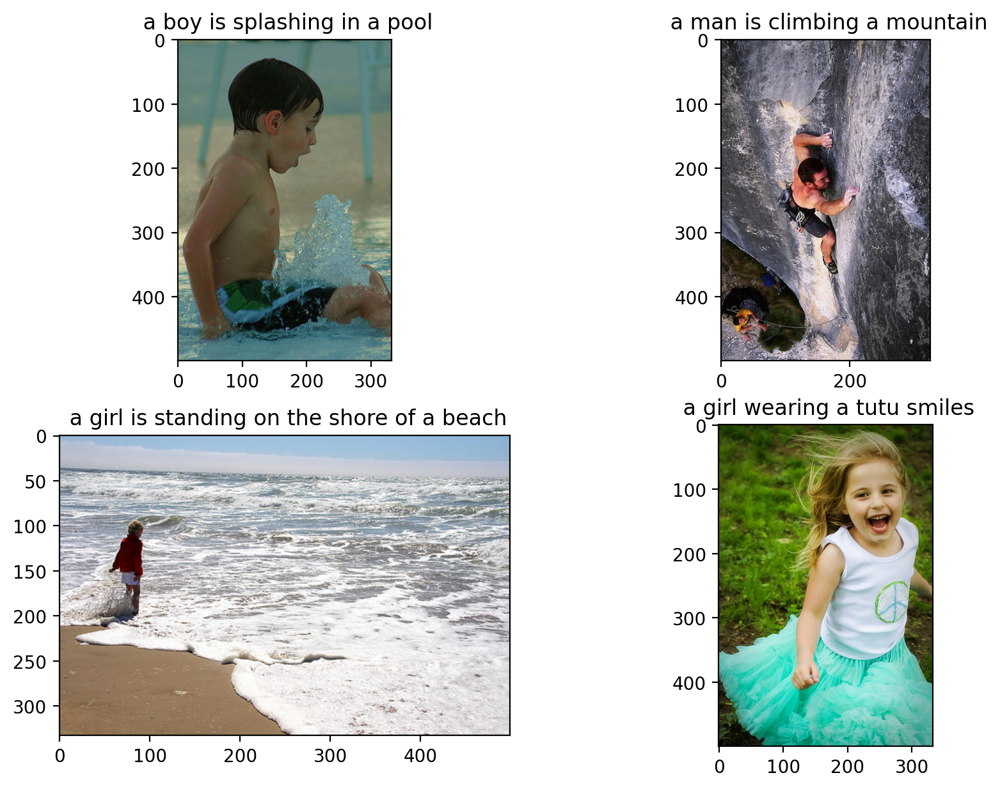

In [144]:
plt.figure(figsize=(10, 15))
for i, (im, pred, refs) in enumerate(high_bleu_scores[:2] + high_bleu_scores[-2:]):
    plt.subplot(int(len(high_bleu_scores)/2)+1, 2, i+1)
    plt.imshow(Image.open('Flicker8k_Dataset/' + im).convert("RGB"))
    plt.title(pred)


## Comparison

* Performs far worse than 2019 Published Results on the Flickr8k dataset --> Achieves Performance far below results below (A Modularized Architecture of Multi-Branch Convolutional Neural Network for Image Captioning)

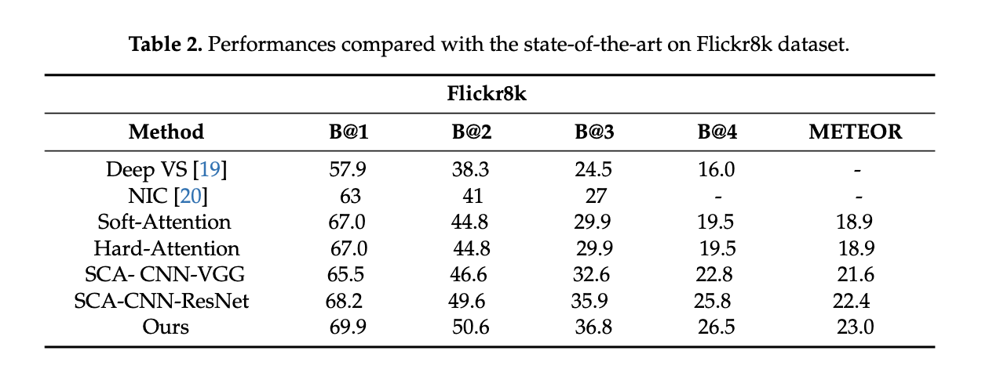

---------------------

## Task 7: Model Improvements

Using some code from DeCap Paper

In [113]:
from enum import Enum
from transformers import GPT2Tokenizer, GPT2LMHeadModel, AdamW, get_linear_schedule_with_warmup
from tqdm import tqdm
import os
import pickle
import sys
import argparse
import json
from typing import Tuple, Optional, Union

from torch import nn
    
class MLP(nn.Module):

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.model(x)

    def __init__(self, sizes: Tuple[int, ...], bias=True, act=nn.Tanh):
        super(MLP, self).__init__()
        layers = []
        for i in range(len(sizes) - 1):
            layers.append(nn.Linear(sizes[i], sizes[i + 1], bias=bias))
            if i < len(sizes) - 2:
                layers.append(act())
        self.model = nn.Sequential(*layers)
        

class DeCap(nn.Module):

    def __init__(self,prefix_size: int = 1024):
        super(DeCap, self).__init__()
        
        # decoder: 4 layers transformer with 4 attention heads
        # the decoder is not pretrained
        
        with open('./decoder_config.pkl','rb') as f:
            config = pickle.load(f)
        self.decoder = GPT2LMHeadModel(config)
        self.embedding_size = self.decoder.transformer.wte.weight.shape[1]
        self.clip_project = MLP((prefix_size,self.embedding_size))
        
    def forward(self, clip_features,tokens):
        embedding_text = self.decoder.transformer.wte(tokens)
        embedding_clip = self.clip_project(clip_features)
        embedding_clip = embedding_clip.reshape(-1,1,self.embedding_size)
        embedding_cat = torch.cat([embedding_clip,embedding_text],dim=1)
        out = self.decoder(inputs_embeds=embedding_cat)
        return out

In [114]:
model.encode_text(clip.tokenize(image_captions_train['caption'][0]).cuda())

tensor([[-0.0754,  0.3718, -0.2227,  ..., -0.1510,  0.1078, -0.0153]],
       device='cuda:0', dtype=torch.float16)

In [115]:
from torch.utils.data import Dataset, DataLoader

class Flicker8K_Dataset(Dataset):
    
    def __init__(self, image_captions, normalize_prefix=False):
        
        self.prefix_length = 10
        self.max_seq_len = 20
        
        self.clip_tokenizer = clip.tokenize
        self.captions = image_captions
            
        random.shuffle(self.captions)
        self.captions_tokens = []
        for caption in self.captions[:]:
            try:
                self.captions_tokens.append(torch.tensor(self.clip_tokenizer(caption)[0], dtype=torch.int64))
            except:
                continue

    def __len__(self) -> int:
        return len(self.captions_tokens)
    
    def pad_tokens(self, item: int):
        tokens = self.captions_tokens[item]
        padding = self.max_seq_len - tokens.shape[0]
        if padding > 0:
            tokens = torch.cat((tokens, torch.zeros(padding, dtype=torch.int64)))
        elif padding < 0:
            tokens = tokens[:self.max_seq_len]
        return tokens


    def __getitem__(self, item: int) -> Tuple[torch.Tensor, ...]:
        
        clip_tokens = self.pad_tokens(item)
        clip_tokens_77 = self.captions_tokens[item]
        return clip_tokens,clip_tokens_77


In [116]:
batch_size = 64
num_epochs = 10

flicker_caption_train_dataset = Flicker8K_Dataset(image_captions_train.reset_index()['caption'])
flicker_caption_test_dataset = Flicker8K_Dataset(image_captions_test.reset_index()['caption'])

flicker_caption_train_loader = torch.utils.data.DataLoader(flicker_caption_train_dataset, batch_size=batch_size)
flicker_caption_test_loader = torch.utils.data.DataLoader(flicker_caption_test_dataset, batch_size=batch_size,shuffle=True)

/gpfs/home/sanand14/interventions/interventions-venv/lib/python3.7/site-packages/ipykernel_launcher.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  app.launch_new_instance()


In [117]:
def train_decoder(train_dataloader, batch_size, num_epochs,
          lr: float = 1e-5, warmup_steps: int = 1000, output_prefix: str = ""):

    epochs = num_epochs

    device = torch.device('cuda')
    
    clip_model, preprocess = clip.load("RN50", device=device, jit=False)
    clip_model.eval()
    
    loss_ce = torch.nn.CrossEntropyLoss(ignore_index=0,label_smoothing=0.1)
    
    decap_model = DeCap()
    decap_model.to(device)
    
    optimizer = AdamW(decap_model.parameters(),lr=lr)
        
    scheduler = get_linear_schedule_with_warmup(
        optimizer, num_warmup_steps=warmup_steps, num_training_steps=epochs * len(train_dataloader)
    )
    
    
    for epoch in range(epochs):
        loss_token_save, ac_save= 0,0
        sys.stdout.flush()
        
        print(f">>> Training epoch {epoch}")
        progress = tqdm(total=int(len(train_dataloader)/10), desc=output_prefix)

        for idx,(clip_tokens,clip_tokens_77) in enumerate(train_dataloader):
            clip_tokens,clip_tokens_77 = clip_tokens.to(device),clip_tokens_77.to(device)
            
            with torch.no_grad():
                feature_text = clip_model.encode_text(clip_tokens_77)
                feature_text /= feature_text.norm(dim=-1, keepdim=True)
        
            outputs = decap_model(feature_text.float(),clip_tokens)
            logits = outputs.logits
            logits = logits[:,: -1]
            
            clip_tokens = clip_tokens.flatten()
            logits = logits.reshape(-1, logits.shape[-1])
            
            loss_token = loss_ce(logits, clip_tokens)
            ac = ((logits.argmax(1)==clip_tokens)*(clip_tokens>0)).sum()/(clip_tokens>0).sum()
            
            optimizer.zero_grad()

            loss_token.backward()
            optimizer.step()
            scheduler.step()
            
                
            if(idx+1) %10 ==0:
                progress.set_postfix({"loss_token": loss_token_save/10.0,"acc_token":ac_save/10.0})
                progress.update()
                loss_token_save, ac_save= 0,0
            else:
                loss_token_save += loss_token.item()
                ac_save += ac.item()

        
        progress.close()
        if epoch == epochs - 1:
            torch.save(
                decap_model.state_dict(),
                os.path.join('./models', f"{output_prefix}-{epoch:03d}.pt"),
            )
    return decap_model

In [168]:
decap_model = train_decoder(flicker_caption_train_loader, batch_size, num_epochs)

>>> Training epoch 0



100%|██████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:29<00:00,  1.57it/s, loss_token=6.2, acc_token=0.276]


>>> Training epoch 1



100%|█████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:29<00:00,  1.56it/s, loss_token=4.77, acc_token=0.349]


>>> Training epoch 2



100%|█████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:29<00:00,  1.56it/s, loss_token=4.09, acc_token=0.413]


>>> Training epoch 3



100%|██████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:29<00:00,  1.56it/s, loss_token=3.8, acc_token=0.451]


>>> Training epoch 4



100%|█████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:29<00:00,  1.56it/s, loss_token=3.62, acc_token=0.477]


>>> Training epoch 5



100%|█████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:29<00:00,  1.55it/s, loss_token=3.51, acc_token=0.494]


>>> Training epoch 6



100%|█████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:29<00:00,  1.56it/s, loss_token=3.42, acc_token=0.509]


>>> Training epoch 7



100%|█████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:29<00:00,  1.56it/s, loss_token=3.36, acc_token=0.515]


>>> Training epoch 8



100%|█████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:29<00:00,  1.56it/s, loss_token=3.33, acc_token=0.522]


>>> Training epoch 9



100%|█████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:29<00:00,  1.55it/s, loss_token=3.32, acc_token=0.525]


DeCap(
  (decoder): GPT2LMHeadModel(
    (transformer): GPT2Model(
      (wte): Embedding(50257, 768)
      (wpe): Embedding(1024, 768)
      (drop): Dropout(p=0.1, inplace=False)
      (h): ModuleList(
        (0): GPT2Block(
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (attn): GPT2Attention(
            (c_attn): Conv1D()
            (c_proj): Conv1D()
            (attn_dropout): Dropout(p=0.1, inplace=False)
            (resid_dropout): Dropout(p=0.1, inplace=False)
          )
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): GPT2MLP(
            (c_fc): Conv1D()
            (c_proj): Conv1D()
            (act): NewGELUActivation()
            (dropout): Dropout(p=0.1, inplace=False)
          )
        )
        (1): GPT2Block(
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (attn): GPT2Attention(
            (c_attn): Conv1D()
            (c_proj): Conv1D()
            (a

In [125]:
tokenizer = clip.tokenize
from clip.simple_tokenizer import SimpleTokenizer as _Tokenizer
_Tokenizer = _Tokenizer()

In [120]:
def decoding(model,clip_features):
    model.eval()
    embedding_cat = model.clip_project(clip_features).reshape(1,1,-1)
    entry_length = 30
    temperature = 1
    tokens = None
    for i in range(entry_length):
        outputs = model.decoder(inputs_embeds=embedding_cat)

        logits = outputs.logits
        logits = logits[:, -1, :] / (temperature if temperature > 0 else 1.0)
        logits_max = logits.max()
        logits = torch.nn.functional.softmax(logits)
        next_token = torch.argmax(logits, -1).unsqueeze(0)
        next_token_embed = model.decoder.transformer.wte(next_token)

        if tokens is None:
            tokens = next_token

        else:
            tokens = torch.cat((tokens, next_token), dim=1)
        if next_token.item()==49407:
            break
        embedding_cat = torch.cat((embedding_cat, next_token_embed), dim=1)
    try:
        output_list = list(tokens.squeeze().cpu().numpy())
        output = _Tokenizer.decode(output_list)
    except:
        output = 'None'
    return output

In [121]:
image_captions_train

,image_name,caption,number,label
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...,0,5
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .,1,3
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .,2,3
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...,3,3
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...,4,3
...,...,...,...,...
40450,997338199_7343367d7f.jpg,A person stands near golden walls .,0,6
40451,997338199_7343367d7f.jpg,a woman behind a scrolled wall is writing,1,2
40452,997338199_7343367d7f.jpg,A woman standing near a decorated wall writes .,2,2
40453,997338199_7343367d7f.jpg,The walls are covered in gold and patterns .,3,6


In [126]:
## construct the support memory

data = np.array(image_captions_train['caption'])
text_features = []
captions = []
batch_size = 1000
model.eval()
for i in tqdm(range(0,len(data[:])//batch_size)):
    
    texts = data[i*batch_size:(i+1)*batch_size]
    with torch.no_grad():
        texts_token = tokenizer(texts).cuda()
        text_feature = model.encode_text(texts_token)
        text_features.append(text_feature)
        captions.extend(texts)

text_features = torch.cat(text_features,dim=0)
text_features /= text_features.norm(dim=-1,keepdim=True).float()

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:08<00:00,  3.53it/s]


In [123]:
decap_model = DeCap()
weights_path = './models/-009.pt'
decap_model.load_state_dict(torch.load(weights_path,map_location= torch.device('cpu')))
decap_model = decap_model.cuda()
decap_model = decap_model.eval()

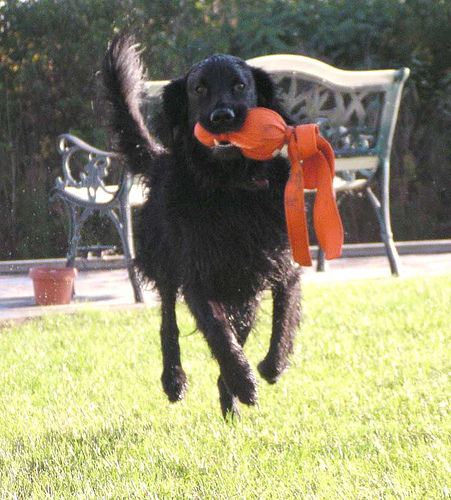

a black dog is running with a ball in its mouth . 


/gpfs/home/sanand14/interventions/interventions-venv/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  del sys.path[0]


In [127]:
path_pic = 'photos/267325341_1a96ef436e.jpg'  #Pictures from MSCOCO val.
image = Image.open(path_pic)
display(image)
image = preprocess(image).unsqueeze(0).cuda()

with torch.no_grad():
    image_features = model.encode_image(image).float()
    image_features /= image_features.norm(dim=-1,keepdim=True)
    sim = image_features@text_features.T.float()
    sim = (sim*100).softmax(dim=-1)
    prefix_embedding = sim@text_features.float()
    prefix_embedding /= prefix_embedding.norm(dim=-1,keepdim=True)
    generated_text = decoding(decap_model,prefix_embedding)
    generated_text = generated_text.replace('<|startoftext|>','').replace('<|endoftext|>','')
    print(generated_text)

In [132]:
def predict_caption(path_pic):
    path_pic = os.path.join('Flicker8k_Dataset', path_pic)
    image = Image.open(path_pic)
    image = preprocess(image).unsqueeze(0).cuda()

    with torch.no_grad():
        image_features = model.encode_image(image).float()
        image_features /= image_features.norm(dim=-1,keepdim=True)
        sim = image_features@text_features.T.float()
        sim = (sim*100).softmax(dim=-1)
        prefix_embedding = sim@text_features.float()
        prefix_embedding /= prefix_embedding.norm(dim=-1,keepdim=True)
        generated_text = decoding(decap_model,prefix_embedding)
        generated_text = generated_text.replace('<|startoftext|>','').replace('<|endoftext|>','')
        return generated_text
    
data_tuples_improved = []
for (im_name, old_pred, refs) in data_tuples:
    new_pred = predict_caption(im_name)
    data_tuples_improved.append((im_name, new_pred, refs))
    

/gpfs/home/sanand14/interventions/interventions-venv/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  del sys.path[0]


In [134]:
torch.save(data_tuples_improved, 'task_7-improved_model.pt')

In [133]:
preds = [dat[1].strip() for dat in data_tuples_improved]
references = [dat[2] for dat in data_tuples_improved]

bleu_score(preds, references, n_gram=1)

tensor(0.5678)

In [135]:
bleu_score(preds, references, n_gram=2)

tensor(0.4025)

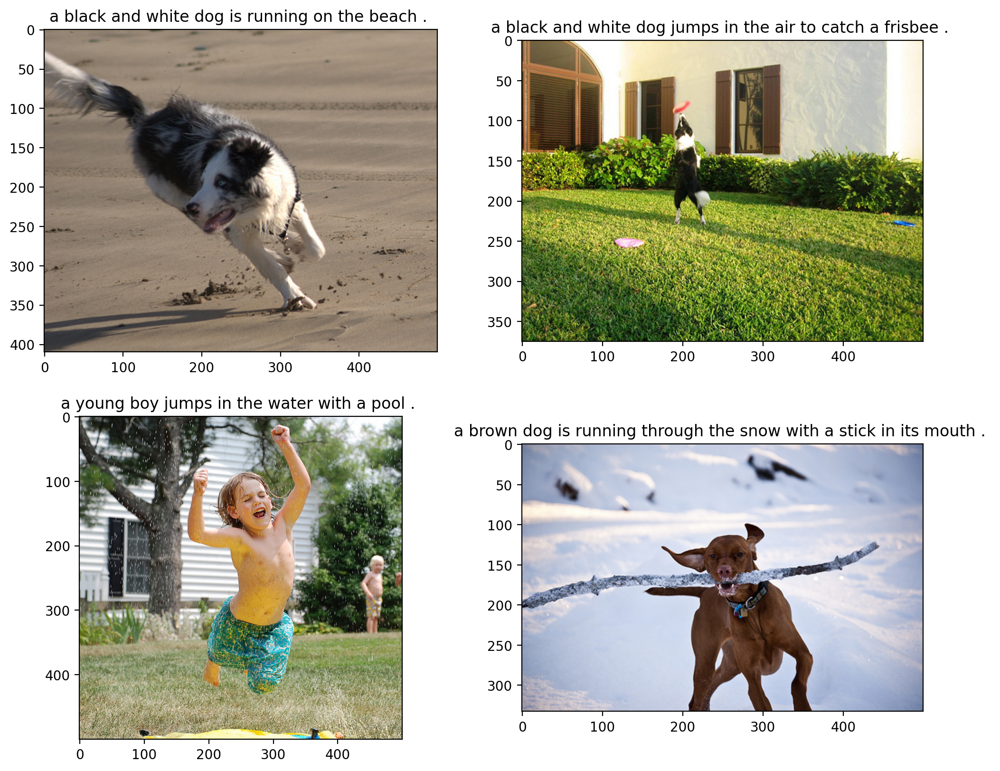

In [141]:
high_bleu_scores = get_high_bleu_scores(data_tuples_improved, threshold=0.9)

plt.figure(figsize=(12, 15))
for i, (im, pred, refs) in enumerate(high_bleu_scores[:4]):
    plt.subplot(int(len(high_bleu_scores)/2)+1, 2, i+1)
    plt.imshow(Image.open('Flicker8k_Dataset/' + im).convert("RGB"))
    plt.title(pred)
